# Notebook demonstrating the use of Timeseriesai for generating predictions
https://github.com/timeseriesAI/timeseriesAI

## The below is done using the tutorial data set (one state, one season) and is a very small dataset so the results are only intended for use on how to use this, not necessarily what the ML capability is

### uses env timeseriesai

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
from tsai.all import *
from joblib import Parallel, delayed
from openavalancheproject.tsai_utilities import *
import zarr
from fastai.callback.tracker import EarlyStoppingCallback


In [3]:
#chck if GPU is available
torch.cuda.device(0)
torch.cuda.is_available()

True

In [4]:
data_root = 'D:/OAPMLData/'

ml_path = data_root + '/4.MLData/'
interpolation = 1
label = 'Day1DangerAboveTreeline'
file_label = 'co_day1above_3h_tutorial'

In [5]:
#load the full X datafile which has both Train and Test concated
X = zarr.open(ml_path + 'X_' + file_label + '.zarr', mode='r')

In [6]:
X.shape

(500, 981, 1441)

In [7]:
#initialize the utilities class
utils = TSAIUtilities(X, label)

In [8]:
feature_names = pd.read_csv(ml_path + '/FeatureLabels_' + file_label + '.csv')
feature_names = feature_names['0'].sort_values().values

In [9]:
#filter down the features to a smaller subset which are more relevant
filtered_feature_list = utils.filter_features(set(feature_names), only_var=False)
print(len(filtered_feature_list))

95


In [10]:
#get those features indexes
filtered_feature_indexes = [list(feature_names).index(x) for x in filtered_feature_list]

In [11]:
#filter down the X data to only those features
#also filter down to only the last 84 days of data
X_small_84 = X.get_orthogonal_selection((slice(None), filtered_feature_indexes, slice(1442-8*84, 1441)))

In [12]:
X_small_84.shape #(samples, features, timesteps)

(500, 95, 671)

In [13]:
#read in the corresponding label files and concat them
#can get the right values here based on the contents of the ml_path directory

num_train_files = 4
file_list = []
for i in range(num_train_files):
    file_list.append(pd.read_parquet(ml_path + '/y_train_batch_' + str(i) + '_' + file_label + '.parquet'))

    
num_test_files = 1
for i in range(num_test_files):
    file_list.append(pd.read_parquet(ml_path + '/y_test_batch_' + str(i + num_train_files) + '_' + file_label + '.parquet'))
    
y_df = pd.concat(file_list).reset_index(drop=True)

In [14]:
y_df['Day1DangerAboveTreeline'].value_counts()

Day1DangerAboveTreeline
Low             148
Moderate        143
Considerable    117
High             92
Name: count, dtype: int64

In [15]:
y, cat_dict = utils.get_y_as_cat(y_df)
cat_dict

{0: 'Low', 1: 'Moderate', 2: 'Considerable', 3: 'High'}

In [16]:
#last 100 days are test
splits = (L(range(0,400)).shuffle(), L(range(400,500)).shuffle())


In [17]:
#calculate the min and maxes so we can normalize the data
feature_mins, feature_maxs = utils.calc_min_max(X_small_84, 0, 400)

on 0
on 10
on 20
on 30
on 40
on 50
on 60
on 70
on 80
on 90


In [18]:
feature_mins_test, feature_maxs_test = utils.calc_min_max(X_small_84, 400, X.shape[0])

on 0
on 10
on 20
on 30
on 40
on 50
on 60
on 70
on 80
on 90


In [19]:
X = X_small_84

In [20]:
splits, dls = utils.create_dls(X_small_84, y, feature_mins=np.array(feature_mins), feature_maxs=np.array(feature_maxs), sample_frac=1, splits=splits)
splits

((#400) [358,349,63,227,375,75,133,370,300,383...],
 (#100) [495,449,431,403,464,446,437,468,435,421...])

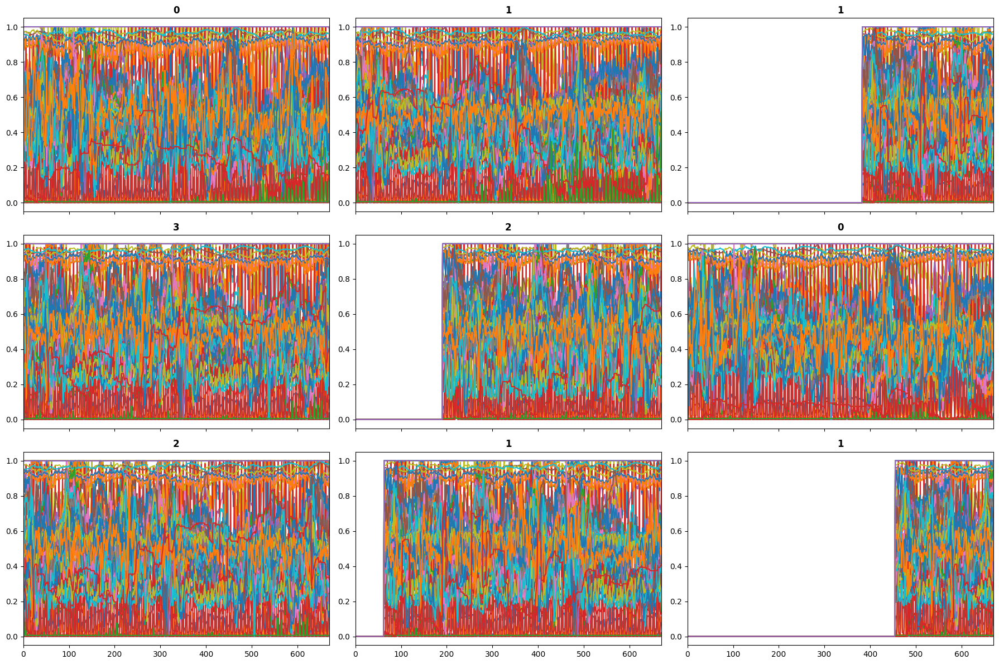

In [21]:
#check the data from the dataloader to ensure its normalized correctly
dls.show_batch()

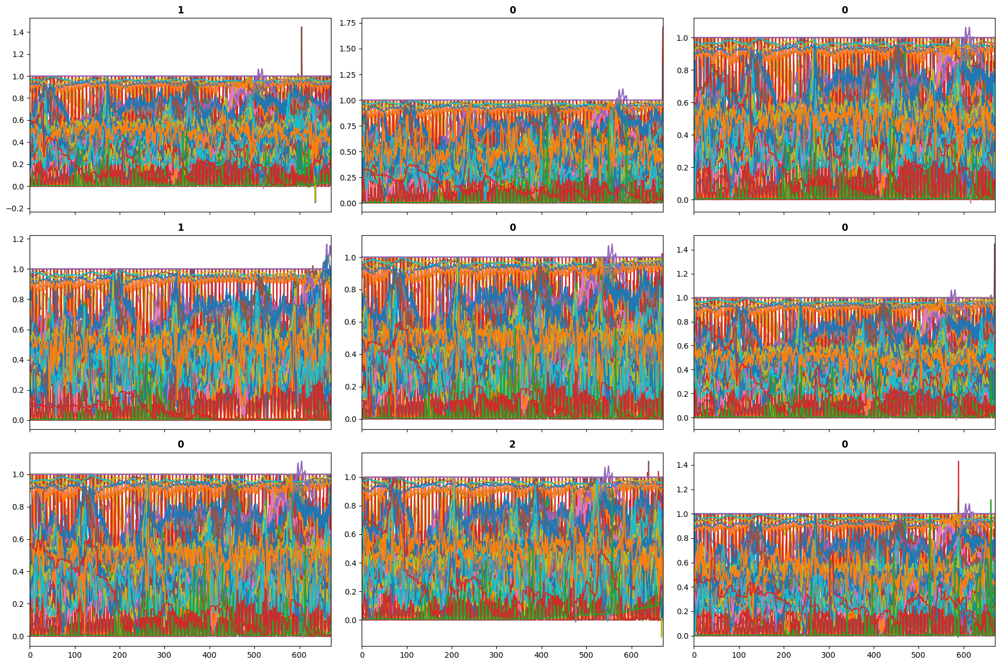

In [22]:
#since normalization values (min/max) are just set on our small training set some of these values might be outside the range
#a larger and more representative training set would improve this
dls.valid.show_batch()

# Lets try and train a model, in the tutorial case we are using an extremely small dataset so no conclusions should be drawn from these results they are for illustrative purposes only

In [29]:
model = TSTPlus(dls.vars, dls.c, dls.len, d_ff=256, d_k=32, d_model=128, d_v=32, dropout=.7, fc_dropout=.1, n_heads=16, n_layers=3)
learn = Learner(dls, model, loss_func=LabelSmoothingCrossEntropyFlat(), metrics=[accuracy, BalancedAccuracy()],  cbs=[ShowGraphCallback2(), PredictionDynamics()])

SuggestedLRs(valley=5.248074739938602e-05)

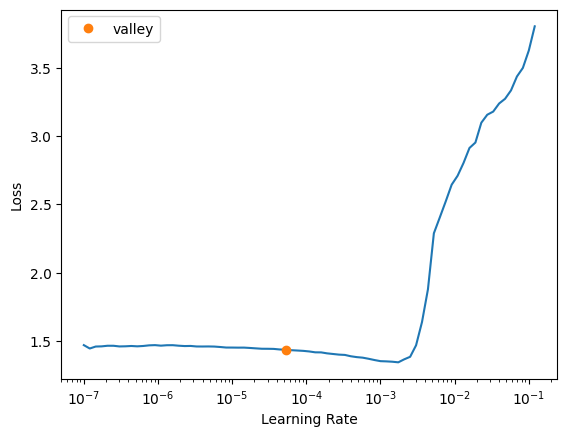

In [25]:
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.461693,1.344478,0.420000,0.325405,00:02
1,1.444226,1.341888,0.420000,0.318182,00:02
2,1.419731,1.338226,0.440000,0.333333,00:02
3,1.407508,1.326143,0.440000,0.333333,00:02
4,1.382182,1.313726,0.430000,0.326286,00:02
5,1.344388,1.288548,0.480000,0.365046,00:02
6,1.315316,1.299669,0.540000,0.414376,00:02
7,1.283139,1.260546,0.520000,0.397992,00:02
8,1.250509,1.238437,0.490000,0.374560,00:02
9,1.217575,1.235109,0.510000,0.391121,00:02


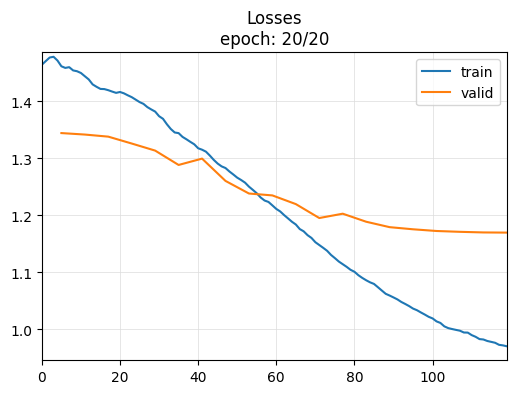

,train_loss,valid_loss,accuracy,balanced_accuracy_score
19,0.970384,1.169834,0.52,0.396054


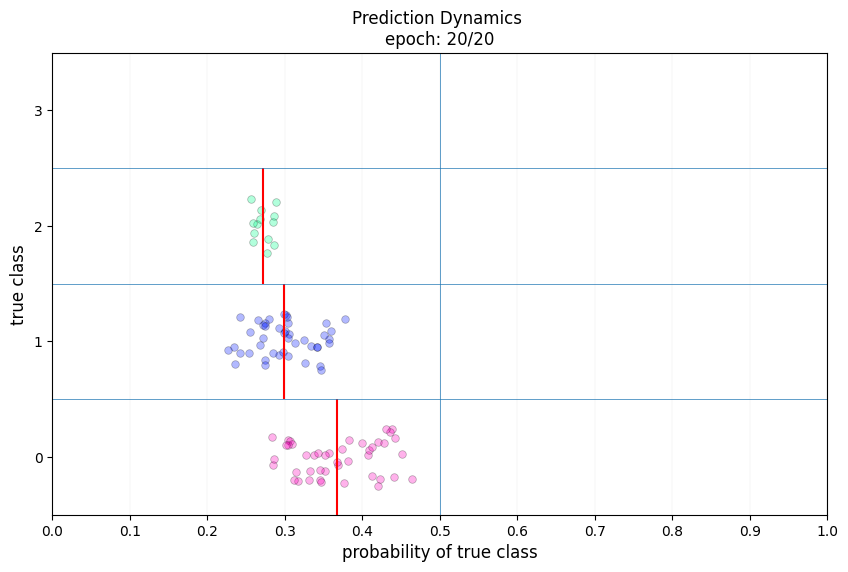

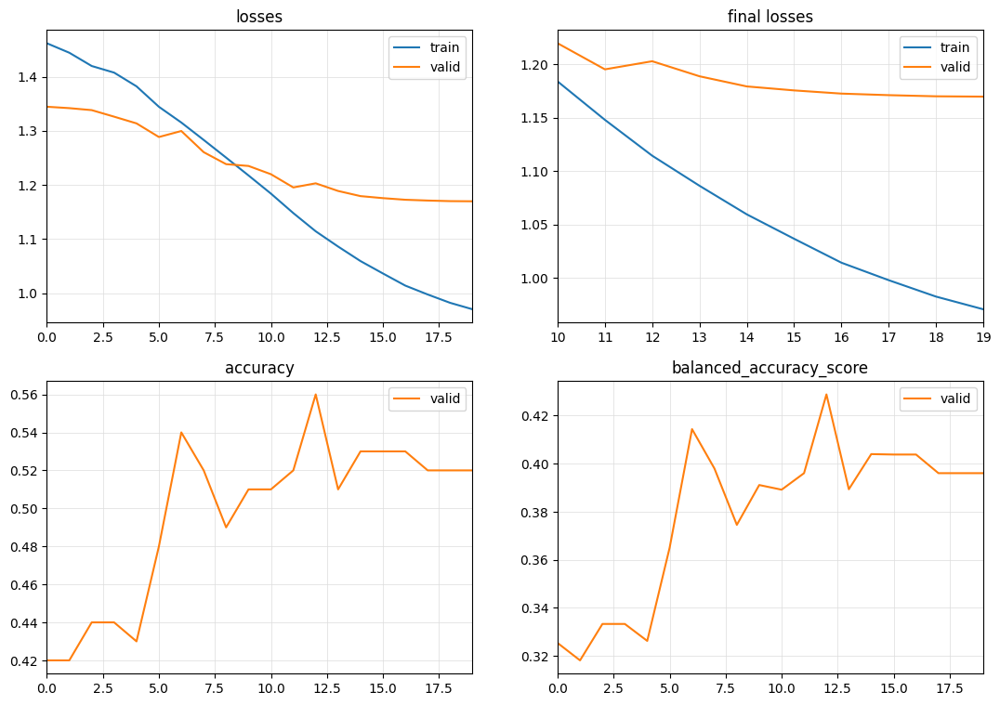

In [30]:
learn.fit_one_cycle(20, 1e-4)

## Below is with a much larger and more representative training set
### Current results represnt state of the art for this project at 51.3205% Balanced Accuracy

In [5]:
file_label = 'ca_co_day1above_3h_84d'
X = zarr.open(ml_path + 'X_' + file_label + '.zarr', mode='r')

In [63]:
X.shape

(480000, 82, 673)

In [6]:

utils = TSAIUtilities(X, label)
feature_names = pd.read_csv(ml_path + '/FeatureLabels_' + file_label + '.csv')
feature_names = feature_names['0'].sort_values().values

In [7]:
feature_names

array(['ACPCP_surface_sum', 'APCP_surface_sum', 'APTMP_2maboveground_avg',
       'CAPE_180M0mbaboveground_avg', 'CAPE_255M0mbaboveground_avg',
       'CAPE_surface_avg', 'CIN_180M0mbaboveground_avg',
       'CIN_255M0mbaboveground_avg', 'CIN_surface_avg',
       'GUST_surface_avg', 'RH_0D44M0D72sigmalayer_avg',
       'RH_2maboveground_avg', 'RH_30M0mbaboveground_avg', 'RH_70mb_avg',
       'RH_975mb_avg', 'SNOD_surface_avg', 'TMP_100maboveground_avg',
       'TMP_2maboveground_avg', 'TMP_30M0mbaboveground_avg',
       'TMP_350mb_avg', 'TMP_400mb_avg', 'TMP_800mb_avg',
       'TMP_80maboveground_avg', 'TMP_surface_avg',
       'UGRD_0D995sigmalevel_avg', 'UGRD_1000mb_avg', 'UGRD_100mb_avg',
       'UGRD_10mb_avg', 'UGRD_150mb_avg', 'UGRD_200mb_avg',
       'UGRD_20mb_avg', 'UGRD_250mb_avg', 'UGRD_300mb_avg',
       'UGRD_30mb_avg', 'UGRD_350mb_avg', 'UGRD_400mb_avg',
       'UGRD_450mb_avg', 'UGRD_500mb_avg', 'UGRD_50mb_avg',
       'UGRD_550mb_avg', 'UGRD_600mb_avg', 'UGRD_650mb_avg'

In [8]:
num_train_files = 200 
file_list = []
for i in range(num_train_files):
    file_list.append(pd.read_parquet(ml_path + '/y_train_batch_' + str(i) + '_' + file_label + '.parquet'))

    
num_test_files = 40 
for i in range(num_test_files):
    file_list.append(pd.read_parquet(ml_path + '/y_test_batch_' + str(i + num_train_files) + '_' + file_label + '.parquet'))
    
y_df = pd.concat(file_list).reset_index(drop=True)

In [9]:
y_df['Day1DangerAboveTreeline'].value_counts()

Day1DangerAboveTreeline
Considerable    138468
Moderate        138382
High            113780
Low              89370
Name: count, dtype: int64

In [10]:
y, cat_dict = utils.get_y_as_cat(y_df)
cat_dict

{0: 'Low', 1: 'Moderate', 2: 'Considerable', 3: 'High'}

In [11]:
train_test_seperator = len(y_df[y_df['season'] != '20-21'])

In [12]:
splits = (L(range(0,train_test_seperator)).shuffle(), L(range(train_test_seperator,len(y_df))).shuffle())

In [71]:
feature_mins, feature_maxs = utils.calc_min_max(X, 0, train_test_seperator)

on 0
on 10
on 20
on 30
on 40
on 50
on 60
on 70
on 80


In [72]:
#save feature_mins and feature_maxes to disk
np.save(ml_path + 'feature_mins_' + file_label + '.npy', feature_mins)
np.save(ml_path + 'feature_maxs_' + file_label + '.npy', feature_maxs)

In [14]:
#read feature_mins and feature_maxes from disk
feature_mins = np.load(ml_path + 'feature_mins_' + file_label + '.npy')
feature_maxs = np.load(ml_path + 'feature_maxs_' + file_label + '.npy')


In [15]:
splits2, dls = utils.create_dls(X, y, feature_mins=np.array(feature_mins), feature_maxs=np.array(feature_maxs), sample_frac=1.0, splits=splits, batch_size=100)
splits2

((#400000) [285722,130588,396503,55603,58876,121425,364102,336153,293331,80828...],
 (#80000) [476613,463475,449737,407612,415881,476187,418142,445067,400735,449461...])

In [17]:
model = TSTPlus(dls.vars, dls.c, seq_len=X.shape[2], d_model=128, n_heads=1, d_k=48, d_v=48, d_ff=128, dropout=.6, n_layers=1, fc_dropout=.8, store_attn=False)
learn = Learner(dls, model, loss_func=LabelSmoothingCrossEntropyFlat(), metrics=[accuracy, BalancedAccuracy()],  opt_func=partial(Adam, decouple_wd=False),cbs=[CutMix1d(), ShowGraphCallback2(), PredictionDynamics()])

In [18]:
lr = 1e-5

epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.589012,1.359510,0.268937,0.255101,38:42
1,1.551345,1.337420,0.344537,0.347179,11:27
2,1.526508,1.315714,0.386838,0.398051,11:27
3,1.485785,1.294750,0.398463,0.411866,11:32
4,1.467053,1.275840,0.407988,0.422431,11:43
5,1.432878,1.256863,0.433987,0.447532,11:45
6,1.397655,1.240530,0.449075,0.463679,11:37
7,1.370971,1.223670,0.460488,0.475089,11:26
8,1.351115,1.206006,0.463500,0.478378,11:37
9,1.323783,1.188506,0.465000,0.480164,11:26


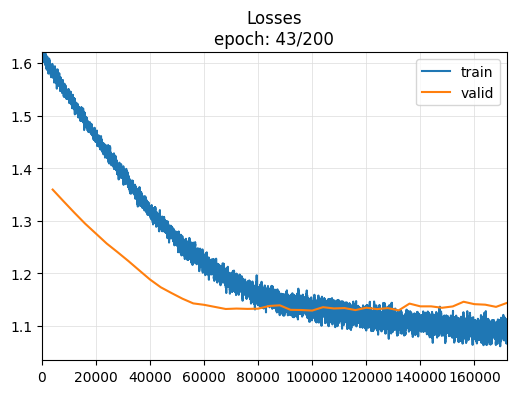

,train_loss,valid_loss,accuracy,balanced_accuracy_score
42,1.077271,1.143912,0.494713,0.497869


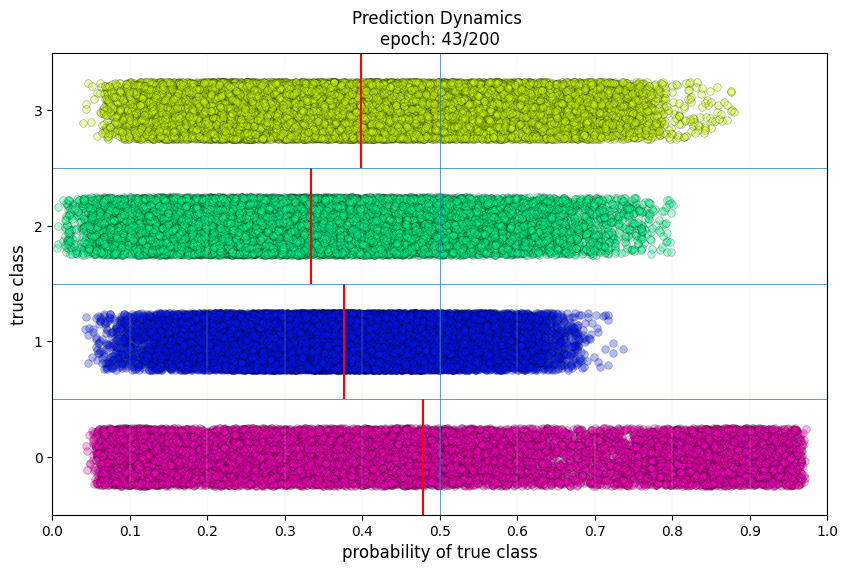

No improvement since epoch 28: early stopping


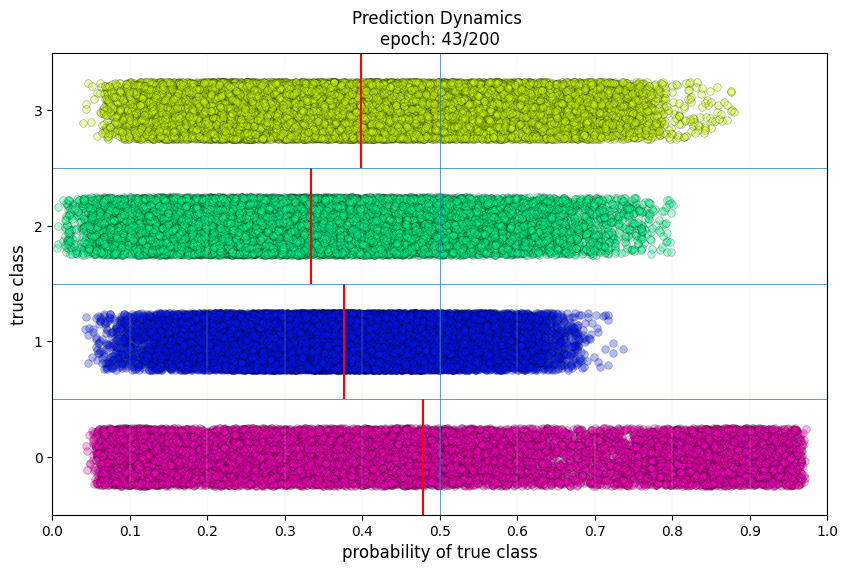

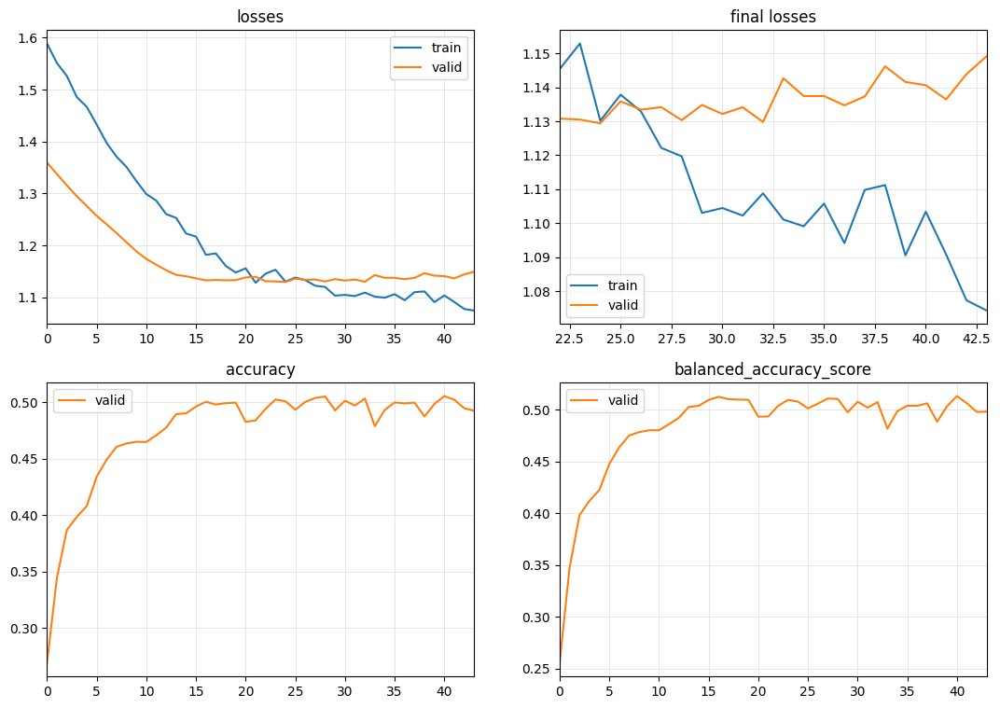

In [19]:
learn.fit_one_cycle(200, lr, cbs=[EarlyStoppingCallback(monitor='accuracy', min_delta=0.001, patience=15)])

### Results


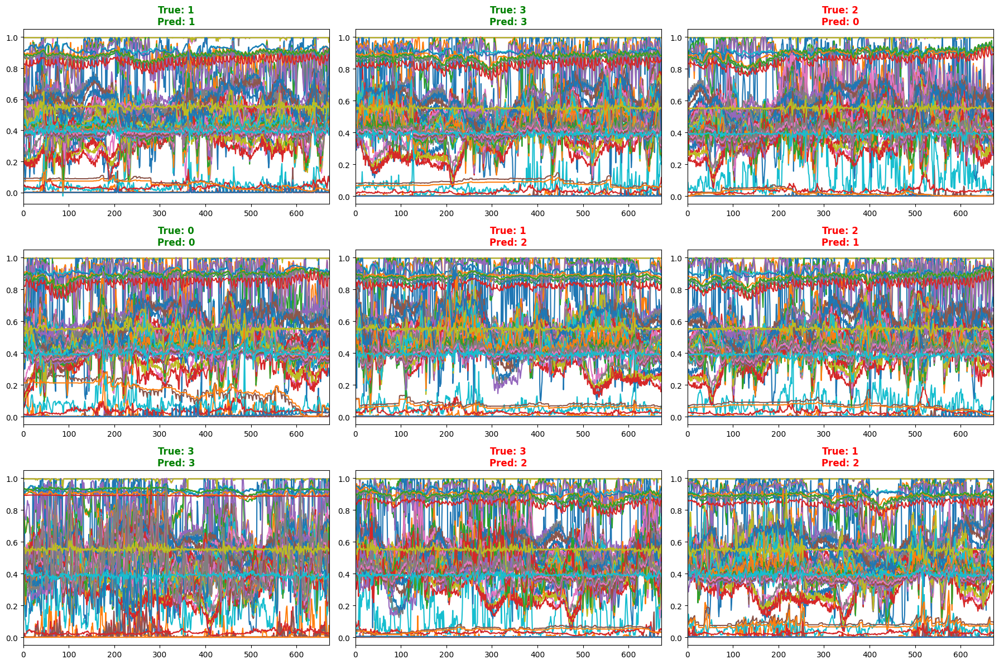

In [36]:
learn.show_results()

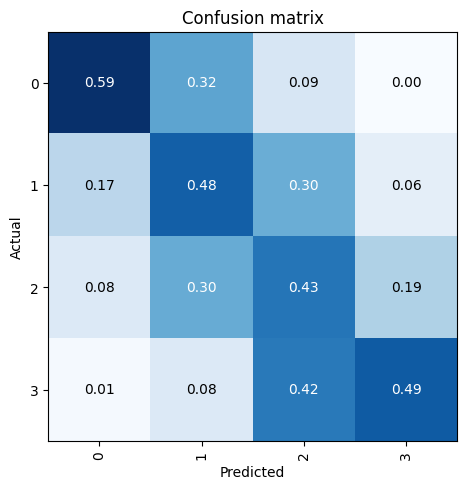

In [21]:
interp = ClassificationInterpretation.from_learner(learn)
conf_matrix = interp.plot_confusion_matrix(normalize=True)

X.shape: (40000, 82, 673)
y.shape: (40000,)
Selected metric: accuracy
Computing feature importance (permutation method)...


  0 feature: BASELINE             accuracy: 0.751700


  0 feature: ACPCP_surface_sum    accuracy: 0.751675


  1 feature: APCP_surface_sum     accuracy: 0.751400


  2 feature: APTMP_2maboveground_avg accuracy: 0.703200


  3 feature: CAPE_180M0mbaboveground_avg accuracy: 0.751775


  4 feature: CAPE_255M0mbaboveground_avg accuracy: 0.751550


  5 feature: CAPE_surface_avg     accuracy: 0.751775


  6 feature: CIN_180M0mbaboveground_avg accuracy: 0.675875


  7 feature: CIN_255M0mbaboveground_avg accuracy: 0.668075


  8 feature: CIN_surface_avg      accuracy: 0.660525


  9 feature: GUST_surface_avg     accuracy: 0.743675


 10 feature: RH_0D44M0D72sigmalayer_avg accuracy: 0.662575


 11 feature: RH_2maboveground_avg accuracy: 0.702800


 12 feature: RH_30M0mbaboveground_avg accuracy: 0.653700


 13 feature: RH_70mb_avg          accuracy: 0.749450


 14 feature: RH_975mb_avg         accuracy: 0.730725


 15 feature: SNOD_surface_avg     accuracy: 0.749200


 16 feature: TMP_100maboveground_avg accuracy: 0.700700


 17 feature: TMP_2maboveground_avg accuracy: 0.683675


 18 feature: TMP_30M0mbaboveground_avg accuracy: 0.645500


 19 feature: TMP_350mb_avg        accuracy: 0.726125


 20 feature: TMP_400mb_avg        accuracy: 0.712850


 21 feature: TMP_800mb_avg        accuracy: 0.669925


 22 feature: TMP_80maboveground_avg accuracy: 0.669725


 23 feature: TMP_surface_avg      accuracy: 0.664125


 24 feature: UGRD_0D995sigmalevel_avg accuracy: 0.731425


 25 feature: UGRD_1000mb_avg      accuracy: 0.743850


 26 feature: UGRD_100mb_avg       accuracy: 0.688375


 27 feature: UGRD_10mb_avg        accuracy: 0.739250


 28 feature: UGRD_150mb_avg       accuracy: 0.700575


 29 feature: UGRD_200mb_avg       accuracy: 0.748500


 30 feature: UGRD_20mb_avg        accuracy: 0.735825


 31 feature: UGRD_250mb_avg       accuracy: 0.751175


 32 feature: UGRD_300mb_avg       accuracy: 0.725950


 33 feature: UGRD_30mb_avg        accuracy: 0.749875


 34 feature: UGRD_350mb_avg       accuracy: 0.744825


 35 feature: UGRD_400mb_avg       accuracy: 0.732550


 36 feature: UGRD_450mb_avg       accuracy: 0.701600


 37 feature: UGRD_500mb_avg       accuracy: 0.719900


 38 feature: UGRD_50mb_avg        accuracy: 0.753000


 39 feature: UGRD_550mb_avg       accuracy: 0.722650


 40 feature: UGRD_600mb_avg       accuracy: 0.742575


 41 feature: UGRD_650mb_avg       accuracy: 0.729575


 42 feature: UGRD_700mb_avg       accuracy: 0.749350


 43 feature: UGRD_70mb_avg        accuracy: 0.744675


 44 feature: UGRD_750mb_avg       accuracy: 0.738800


 45 feature: UGRD_800mb_avg       accuracy: 0.730450


 46 feature: UGRD_850mb_avg       accuracy: 0.749650


 47 feature: UGRD_900mb_avg       accuracy: 0.750600


 48 feature: UGRD_925mb_avg       accuracy: 0.738675


 49 feature: UGRD_950mb_avg       accuracy: 0.751925


 50 feature: UGRD_975mb_avg       accuracy: 0.753300


 51 feature: VGRD_0D995sigmalevel_avg accuracy: 0.756075


 52 feature: VGRD_1000mb_avg      accuracy: 0.748050


 53 feature: VGRD_100mb_avg       accuracy: 0.722450


 54 feature: VGRD_10mb_avg        accuracy: 0.691800


 55 feature: VGRD_150mb_avg       accuracy: 0.736050


 56 feature: VGRD_200mb_avg       accuracy: 0.734575


 57 feature: VGRD_20mb_avg        accuracy: 0.728700


 58 feature: VGRD_250mb_avg       accuracy: 0.730025


 59 feature: VGRD_300mb_avg       accuracy: 0.745900


 60 feature: VGRD_30mb_avg        accuracy: 0.745125


 61 feature: VGRD_350mb_avg       accuracy: 0.742225


 62 feature: VGRD_400mb_avg       accuracy: 0.732150


 63 feature: VGRD_450mb_avg       accuracy: 0.746325


 64 feature: VGRD_500mb_avg       accuracy: 0.729375


 65 feature: VGRD_50mb_avg        accuracy: 0.714725


 66 feature: VGRD_550mb_avg       accuracy: 0.733675


 67 feature: VGRD_600mb_avg       accuracy: 0.732575


 68 feature: VGRD_650mb_avg       accuracy: 0.745325


 69 feature: VGRD_700mb_avg       accuracy: 0.743625


 70 feature: VGRD_70mb_avg        accuracy: 0.733325


 71 feature: VGRD_750mb_avg       accuracy: 0.750575


 72 feature: VGRD_800mb_avg       accuracy: 0.754800


 73 feature: VGRD_850mb_avg       accuracy: 0.755650


 74 feature: VGRD_900mb_avg       accuracy: 0.752525


 75 feature: VGRD_925mb_avg       accuracy: 0.743850


 76 feature: VGRD_950mb_avg       accuracy: 0.748475


 77 feature: VGRD_975mb_avg       accuracy: 0.746075


 78 feature: VVEL_200mb_avg       accuracy: 0.749400


 79 feature: VVEL_450mb_avg       accuracy: 0.749625


 80 feature: WATR_surface_sum     accuracy: 0.751250


 81 feature: WEASD_surface_avg    accuracy: 0.750250



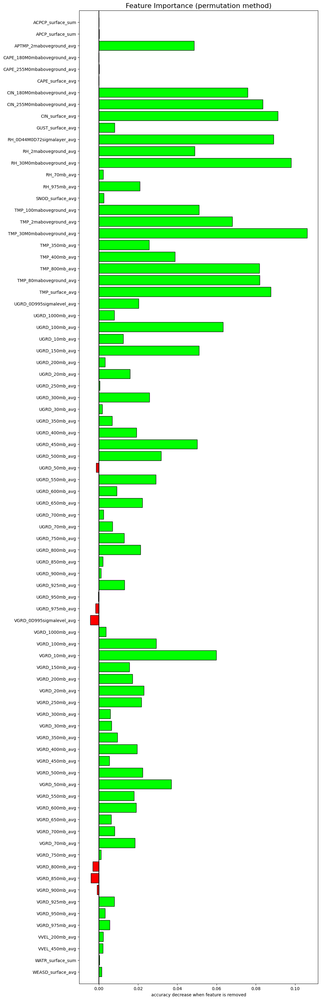

In [34]:
#list feature importances
fi = learn.feature_importance(partial_n=0.1, feature_names=list(feature_names))